# Baseline Modeling and Evaluation Metrics

With the Exploratory Data Analysis done, I can explore baseline models for the data and their evaluation metrics. We will start by splitting the data before fitting any models.

In [1]:
import numpy as np
import pandas as pd
import calendar

# plotting
import plotly.express as px
import plotly.offline as pyo
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import matplotlib.pyplot as plt
import seaborn as sns

# stats
from statsmodels.api import tsa # time series analysis
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import month_plot

#modeling
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from statsmodels.tsa.api import VAR
import math

In [2]:
df = pd.read_csv('../data/weatherstats_vancouver_hourly_clean.csv')
df.head()

,date_time_local,pressure_station,pressure_sea,wind_dir,wind_speed,wind_gust,relative_humidity,dew_point,temperature,windchill,humidex,visibility,health_index,cloud_okta,max_air_temp_pst1hr,min_air_temp_pst1hr
0,2013-07-01 00:00:00,101.18,101.16,SSE,7,0.0,91,18.2,19.7,0.0,0.0,32200.0,2.9,5.0,19.4,18.5
1,2013-07-01 01:00:00,101.22,101.21,SE,6,0.0,89,17.8,19.6,0.0,0.0,32200.0,3.0,5.0,20.1,18.7
2,2013-07-01 02:00:00,101.26,101.24,E,11,0.0,88,16.7,18.7,0.0,0.0,32200.0,3.0,5.0,19.8,18.0
3,2013-07-01 03:00:00,101.26,101.25,E,4,0.0,84,16.5,19.2,0.0,0.0,32200.0,2.7,5.0,18.5,17.5
4,2013-07-01 04:00:00,101.30,101.28,NNW,5,0.0,87,15.7,17.9,0.0,0.0,32200.0,2.6,5.0,18.8,17.3


In [3]:
# Setting date as index.
df['date_time_local'] = pd.to_datetime(df['date_time_local'], utc=False)
df = df.set_index('date_time_local')
df.head()

,pressure_station,pressure_sea,wind_dir,wind_speed,wind_gust,relative_humidity,dew_point,temperature,windchill,humidex,visibility,health_index,cloud_okta,max_air_temp_pst1hr,min_air_temp_pst1hr
date_time_local,,,,,,,,,,,,,,,
2013-07-01 00:00:00,101.18,101.16,SSE,7,0.0,91,18.2,19.7,0.0,0.0,32200.0,2.9,5.0,19.4,18.5
2013-07-01 01:00:00,101.22,101.21,SE,6,0.0,89,17.8,19.6,0.0,0.0,32200.0,3.0,5.0,20.1,18.7
2013-07-01 02:00:00,101.26,101.24,E,11,0.0,88,16.7,18.7,0.0,0.0,32200.0,3.0,5.0,19.8,18.0
2013-07-01 03:00:00,101.26,101.25,E,4,0.0,84,16.5,19.2,0.0,0.0,32200.0,2.7,5.0,18.5,17.5
2013-07-01 04:00:00,101.30,101.28,NNW,5,0.0,87,15.7,17.9,0.0,0.0,32200.0,2.6,5.0,18.8,17.3


In [4]:
# Confirming index is date.
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 87648 entries, 2013-07-01 00:00:00 to 2023-06-30 23:00:00
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   pressure_station     87648 non-null  float64
 1   pressure_sea         87648 non-null  float64
 2   wind_dir             87648 non-null  object 
 3   wind_speed           87648 non-null  int64  
 4   wind_gust            87648 non-null  float64
 5   relative_humidity    87648 non-null  int64  
 6   dew_point            87648 non-null  float64
 7   temperature          87648 non-null  float64
 8   windchill            87648 non-null  float64
 9   humidex              87648 non-null  float64
 10  visibility           87648 non-null  float64
 11  health_index         87648 non-null  float64
 12  cloud_okta           87648 non-null  float64
 13  max_air_temp_pst1hr  87648 non-null  float64
 14  min_air_temp_pst1hr  87648 non-null  float64
dtypes

## Model #1: Linear Regression Including Dew Point

In [5]:
# I am dropping max/min temp and sea pressure per my observation on the EDA. Wind_dir is an object to it will be dropped too.
X = df.drop(['max_air_temp_pst1hr', 'min_air_temp_pst1hr', 'temperature', 'pressure_sea', 'wind_dir'], axis=1)
y = df['temperature']

In [6]:
# The split in a Time Series has to be done by entering the exact date to avoid randomness.
# The data is split 7 years for the train and 3 for the split.
X_train = X.loc[X.index <= "2020-06-30"]
X_test = X.loc[X.index > "2020-06-30"]
y_train = y.loc[y.index <= "2020-06-30"]
y_test = y.loc[y.index > "2020-06-30"]

In [7]:
# Printing the shapes of the train and test to check they match and the split was done correctly.
print(f" X_train Shape is: {X_train.shape}")
print(f" y_train Shape is: {y_train.shape}")
print(f" X_test Shape is: {X_test.shape}")
print(f" y_test Shape is: {y_test.shape}")

 X_train Shape is: (61345, 10)
 y_train Shape is: (61345,)
 X_test Shape is: (26303, 10)
 y_test Shape is: (26303,)


In [8]:
# Scaling data due to large numbers like visibility
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [9]:
# This figure visualizes the train and test split for temperature (the dependent variable).
fig = go.Figure()
fig.add_trace(go.Scatter(x=y_train.index, y=y_train, mode='lines', name="Train"))
fig.add_trace(go.Scatter(x=y_test.index, y=y_test, mode='lines', name="Test"))
fig.update_layout(
    yaxis_title="Difference (billions)", 
    xaxis_title="Date",
    title="Change in Revenue Passenger Miles over Prior Year"
)
fig.show()

In [10]:
# Defining the mean absolute percentage error function
def mean_absolute_percentage_error(true_values, predicted_values):
    """
    Calculate the mean absolute percentage error. 
    Find the prediction error and devide by the true value, then average.
    """
    # Filter out the zero values to avoid division by zero
    mask = true_values != 0
    true_values = true_values[mask]
    predicted_values = predicted_values[mask]
    
    error = true_values - predicted_values
    absolute_percentage_error = np.abs(error/true_values)
    mape = absolute_percentage_error.mean() * 100
    
    return mape

# Instantiate the model
model = LinearRegression()

# Fitting the model on the training data
model.fit(X_train, y_train)

# Making predictions on the train data
y_train_pred = model.predict(X_train)

# Evaluating the model on the training data
train_mae = mean_absolute_error(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_mape = mean_absolute_percentage_error(y_train, y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

# Making predictions on the testdata
y_pred = model.predict(X_test)

# Evaluate the model on the test data
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = mean_absolute_percentage_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print the evaluation metrics for both training and test data
print(f'''Training Data:
Mean Absolute Error: {round(train_mae, 4)}
Mean Squared Error: {round(train_mse, 2)}
Root Mean Squared Error: {round(train_rmse, 4)}
Mean Absolute Percentage Error: {round(train_mape, 2)}%
R-squared: {train_r2}''')

print(f'''Test Data:
Mean Absolute Error: {round(mae, 4)}
Mean Squared Error: {round(mse, 4)}
Root Mean Squared Error: {round(rmse, 4)}
Mean Absolute Percentage Error: {round(mape, 2)}%
R-squared: {r2}''')

Training Data:
Mean Absolute Error: 0.2263
Mean Squared Error: 0.12
Root Mean Squared Error: 0.3471
Mean Absolute Percentage Error: 6.48%
R-squared: 0.996936543273997
Test Data:
Mean Absolute Error: 0.2803
Mean Squared Error: 0.1516
Root Mean Squared Error: 0.3894
Mean Absolute Percentage Error: 7.22%
R-squared: 0.9964635344875302


| Metric                         | Train                      | Test                      |
| ------------------------------ | -------------------------- | ------------------------- |
| Mean Absolute Error            | 0.2263                     | 0.2803                    |
| Mean Squared Error             | 0.12                       | 0.1516                    |
| Root Mean Squared Error        | 0.3471                     | 0.3894                    |
| Mean Absolute Percentage Error | 6.48%                      | 7.22%                     |
| R-squared                      | 0.9969365432749397         | 0.9964635344878252        |

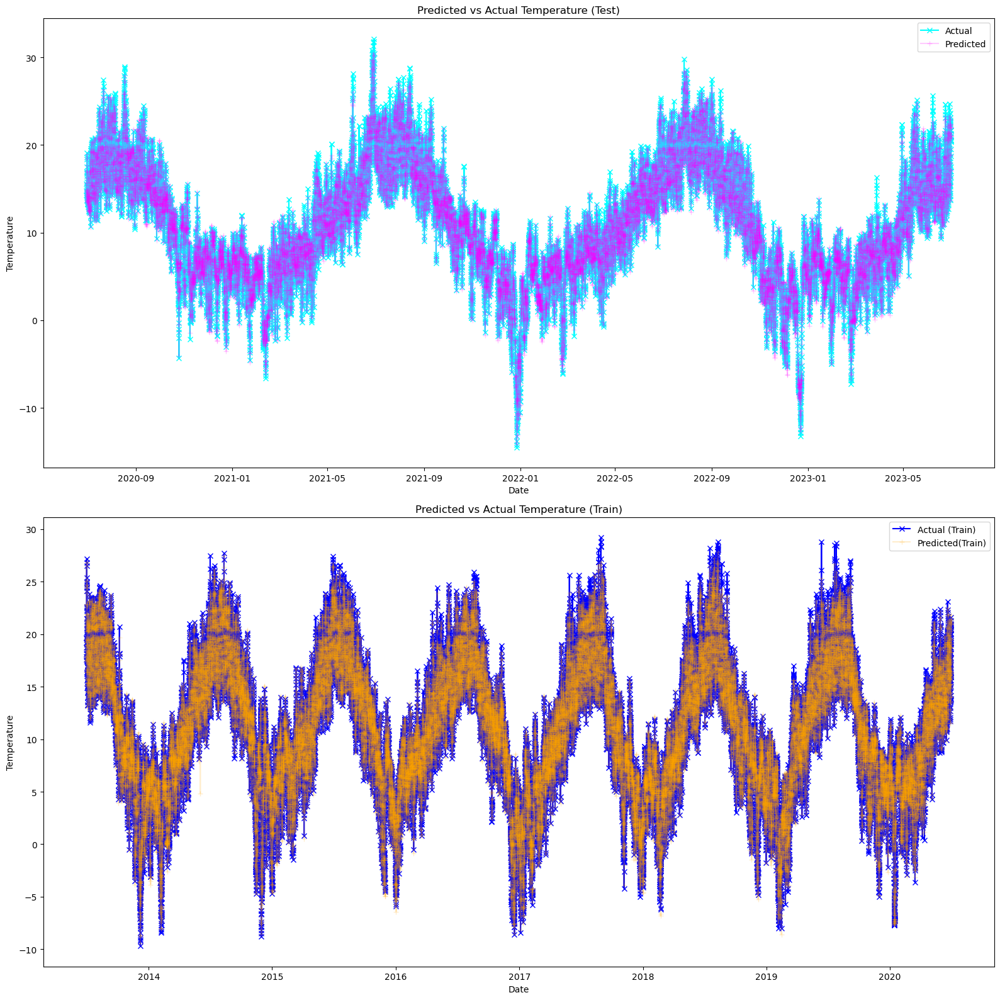

In [11]:
# Below I will plot the test predictions vs. actuals and then the train predictions vs. actuals.
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(16, 16))

# First subplot: Test Data
axes[0].plot(y_test.index, y_test, label='Actual', marker='x', color='cyan')
axes[0].plot(y_test.index, y_pred, label='Predicted', marker='+', color='magenta', alpha=.2)
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Temperature')
axes[0].set_title('Predicted vs Actual Temperature (Test)')
axes[0].legend()

# Second subplot: Train Data
axes[1].plot(y_train.index, y_train, label='Actual (Train)', marker='x', color='blue')
axes[1].plot(y_train.index, y_train_pred, label='Predicted(Train)', marker='+', color='orange', alpha=.2)
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Temperature')
axes[1].set_title('Predicted vs Actual Temperature (Train)')
axes[1].legend()

plt.tight_layout()
plt.show()

These results are very good for a linear regression model. The MAE, MSE, RMSE and MAPE being so low indicate the predictions are highly accurate. The model is performing slightly worse on the test data. In addition, the R-Squared is also very high indicating the accuracy of the model.
</br></br>
The model is performing very good, and as such I cannot take it for granted and must explore what could be causing this. The first thing that comes to mind is that the dew_point has too high of a correlation and may be skewing the results.

## Modeling Dew Point: Linear Regression Including only Dew Point and Temperature

Although its not common practice, I will be fitting a linear regression with dew_point and temperature only to see how much the single variable can affect the temperature predictions.

In [12]:
# Setting the independent variable to Dew Point only
X_dew = df['dew_point']

In [13]:
# Splitting the independent variable on the 7/3 years train/test split.
X_train_dew = X_dew.loc[X.index <= "2020-06-30"]
X_test_dew = X_dew.loc[X.index > "2020-06-30"]

In [14]:
# Printing the shapes of the new X_dew variable to compare to the target variable train/test split.
print(f" X_train Shape is: {X_train_dew.shape}")
print(f" y_train Shape is: {y_train.shape}")
print(f" X_test Shape is: {X_test_dew.shape}")
print(f" y_test Shape is: {y_test.shape}")

 X_train Shape is: (61345,)
 y_train Shape is: (61345,)
 X_test Shape is: (26303,)
 y_test Shape is: (26303,)


In [15]:
# Scaling dew point before fitting the model.
X_train_dew_scaled = scaler.fit_transform(X_train_dew.to_numpy().reshape(-1, 1))
X_test_dew_scaled = scaler.transform(X_test_dew.to_numpy().reshape(-1, 1))

In [16]:
# Fitting the model with dew point as the independent variable and temperature as the target variable.
model.fit(X_train_dew_scaled, y_train)

# Making predictions on the train data
y_train_pred_dew = model.predict(X_train_dew_scaled)

# Evaluating the model on the training data
train_mae_dew = mean_absolute_error(y_train, y_train_pred_dew)
train_mse_dew = mean_squared_error(y_train, y_train_pred_dew)
train_rmse_dew = np.sqrt(train_mse_dew)
train_mape_dew = mean_absolute_percentage_error(y_train, y_train_pred_dew)
train_r2_dew = r2_score(y_train, y_train_pred_dew)

# Making predictions on the test data
y_pred_dew = model.predict(X_test_dew_scaled)

# Evaluate the model on the test data
mae_dew = mean_absolute_error(y_test, y_pred_dew)
mse_dew = mean_squared_error(y_test, y_pred_dew)
rmse_dew = np.sqrt(mse_dew)
mape_dew = mean_absolute_percentage_error(y_test, y_pred_dew)
r2_dew = r2_score(y_test, y_pred_dew)

# Print the evaluation metrics for both training and test data
print(f'''Training Data:
Mean Absolute Error: {round(train_mae_dew, 4)}
Mean Squared Error: {round(train_mse_dew, 2)}
Root Mean Squared Error: {round(train_rmse_dew, 4)}
Mean Absolute Percentage Error: {round(train_mape_dew, 2)}%
R-squared: {train_r2_dew}''')

print(f'''Test Data:
Mean Absolute Error: {round(mae_dew, 4)}
Mean Squared Error: {round(mse_dew, 4)}
Root Mean Squared Error: {round(rmse_dew, 4)}
Mean Absolute Percentage Error: {round(mape_dew, 2)}%
R-squared: {r2_dew}''')

Training Data:
Mean Absolute Error: 2.0862
Mean Squared Error: 7.17
Root Mean Squared Error: 2.6777
Mean Absolute Percentage Error: 51.75%
R-squared: 0.8176998696847291
Test Data:
Mean Absolute Error: 2.279
Mean Squared Error: 8.0734
Root Mean Squared Error: 2.8414
Mean Absolute Percentage Error: 54.25%
R-squared: 0.8116864022251898


| Metric                         | Train                      | Test                      |
| ------------------------------ | -------------------------- | ------------------------- |
| Mean Absolute Error            | 2.0862                     | 2.279                     |
| Mean Squared Error             | 7.17                       | 8.0734                    |
| Root Mean Squared Error        | 2.6777                     | 2.8414                    |
| Mean Absolute Percentage Error | 51.75%                     | 54.25%                    |
| R-squared                      | 0.8176998696847291         | 0.8116864022251898        |

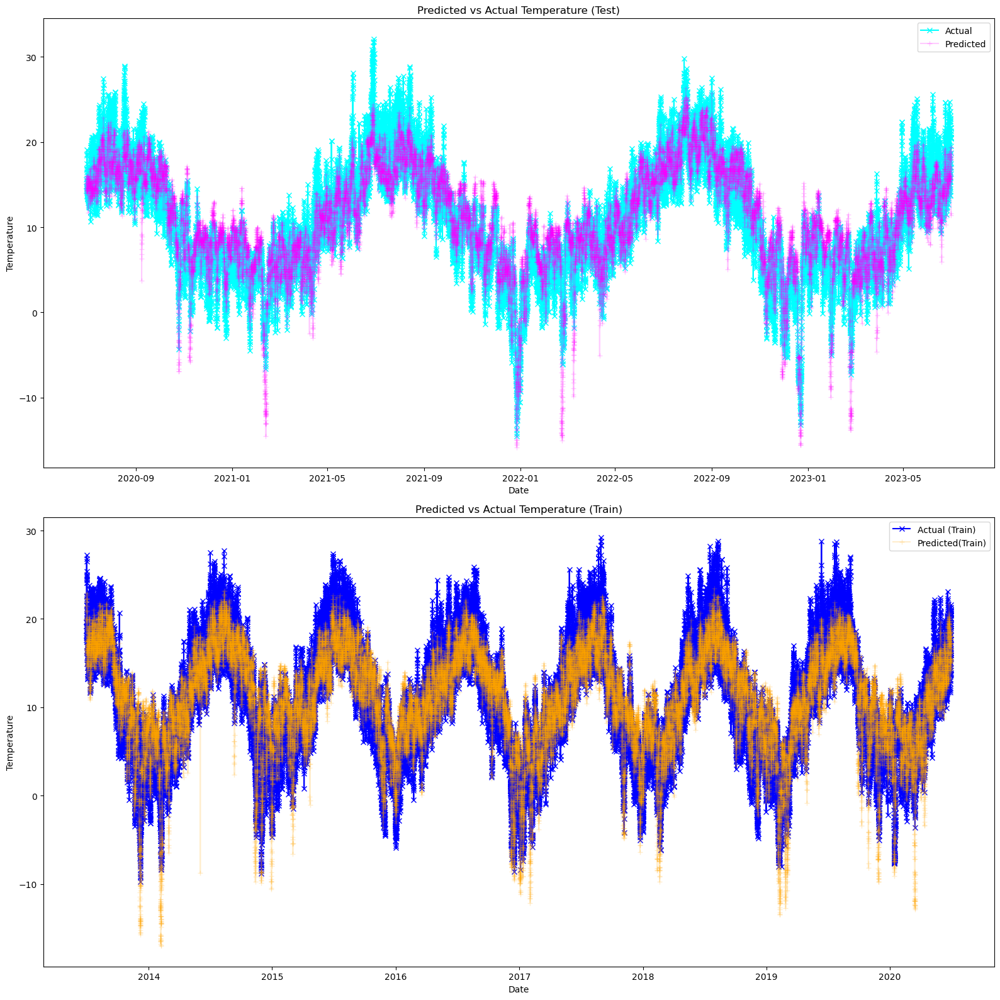

In [17]:
# Below I will plot the test predictions vs. actuals and then the train predictions vs. actuals.
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(16, 16))

# First subplot: Test Data
axes[0].plot(y_test.index, y_test, label='Actual', marker='x', color='cyan')
axes[0].plot(y_test.index, y_pred_dew, label='Predicted', marker='+', color='magenta', alpha=.2)
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Temperature')
axes[0].set_title('Predicted vs Actual Temperature (Test)')
axes[0].legend()

# Second subplot: Train Data
axes[1].plot(y_train.index, y_train, label='Actual (Train)', marker='x', color='blue')
axes[1].plot(y_train.index, y_train_pred_dew, label='Predicted(Train)', marker='+', color='orange', alpha=.2)
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Temperature')
axes[1].set_title('Predicted vs Actual Temperature (Train)')
axes[1].legend()

plt.tight_layout()
plt.show()

Dew Point by itself can be a really good predictor for temperature and the rest of the weather stats seem to add to the accuracy and precision of the prediction model. Note in the visualization above that the dew point by itself is not good at predicting the highest and lowest temperatures.
</br>
After seeing the effect of dew point on temperature based on the results above, I will try to fit the model again but I will drop the dew_point variable.

## Model #2: Linea Regression Excluding Dew Point

In [18]:
# Drop specified columns
model_2_X = df.drop(['max_air_temp_pst1hr', 'min_air_temp_pst1hr', 'temperature', 'pressure_sea', 'wind_dir', 'dew_point'], axis=1)
model_2_y = df['temperature']

# Split the data into training and testing sets based on date
model_2_X_train = model_2_X.loc[model_2_X.index <= "2020-06-30"]
model_2_X_test = model_2_X.loc[model_2_X.index > "2020-06-30"]
model_2_y_train = model_2_y.loc[model_2_y.index <= "2020-06-30"]
model_2_y_test = model_2_y.loc[model_2_y.index > "2020-06-30"]

In [19]:
# Scaling data
model_2_X_train = scaler.fit_transform(model_2_X_train)
model_2_X_test = scaler.transform(model_2_X_test)

In [20]:
# Instantiate model2
model_2_model = LinearRegression()

# Fiting the model on the training data
model_2_model.fit(model_2_X_train, model_2_y_train)

# Making train predictions
model_2_y_train_pred = model_2_model.predict(model_2_X_train)

# Evaluating the model on the training data
model_2_train_mae = mean_absolute_error(model_2_y_train, model_2_y_train_pred)
model_2_train_mse = mean_squared_error(model_2_y_train, model_2_y_train_pred)
model_2_train_rmse = np.sqrt(model_2_train_mse)
model_2_train_mape = mean_absolute_percentage_error(model_2_y_train, model_2_y_train_pred)
model_2_train_r2 = r2_score(model_2_y_train, model_2_y_train_pred)

# Making test predictions
model_2_y_pred = model_2_model.predict(model_2_X_test)

# Evaluating the model on the test data
model_2_mae = mean_absolute_error(model_2_y_test, model_2_y_pred)
model_2_mse = mean_squared_error(model_2_y_test, model_2_y_pred)
model_2_rmse = np.sqrt(model_2_mse)
model_2_mape = mean_absolute_percentage_error(model_2_y_test, model_2_y_pred)
model_2_r2 = r2_score(model_2_y_test, model_2_y_pred)

# Printing the evaluation metrics for both training and test data
print(f'''Training Data:
Mean Absolute Error: {round(model_2_train_mae, 4)}
Mean Squared Error: {round(model_2_train_mse, 2)}
Root Mean Squared Error: {round(model_2_train_rmse, 4)}
Mean Absolute Percentage Error: {round(model_2_train_mape, 2)}%
R-squared: {model_2_train_r2}''')

print(f'''Test Data:
Mean Absolute Error: {round(model_2_mae, 4)}
Mean Squared Error: {round(model_2_mse, 4)}
Root Mean Squared Error: {round(model_2_rmse, 4)}
Mean Absolute Percentage Error: {round(model_2_mape, 2)}%
R-squared: {model_2_r2}''')

Training Data:
Mean Absolute Error: 3.5403
Mean Squared Error: 19.22
Root Mean Squared Error: 4.3842
Mean Absolute Percentage Error: 115.78%
R-squared: 0.5112959872438323
Test Data:
Mean Absolute Error: 3.7976
Mean Squared Error: 21.8036
Root Mean Squared Error: 4.6694
Mean Absolute Percentage Error: 107.85%
R-squared: 0.4914264507810783


| Metric                         | Train                      | Test                      |
| ------------------------------ | -------------------------- | ------------------------- |
| Mean Absolute Error            | 3.5403                     | 3.7976                    |
| Mean Squared Error             | 19.22                      | 21.8036                   |
| Root Mean Squared Error        | 4.3842                     | 4.6694                    |
| Mean Absolute Percentage Error | 115.78%                    | 107.85%                   |
| R-squared                      | 0.5112959872106125         | 0.4914264507814935        |

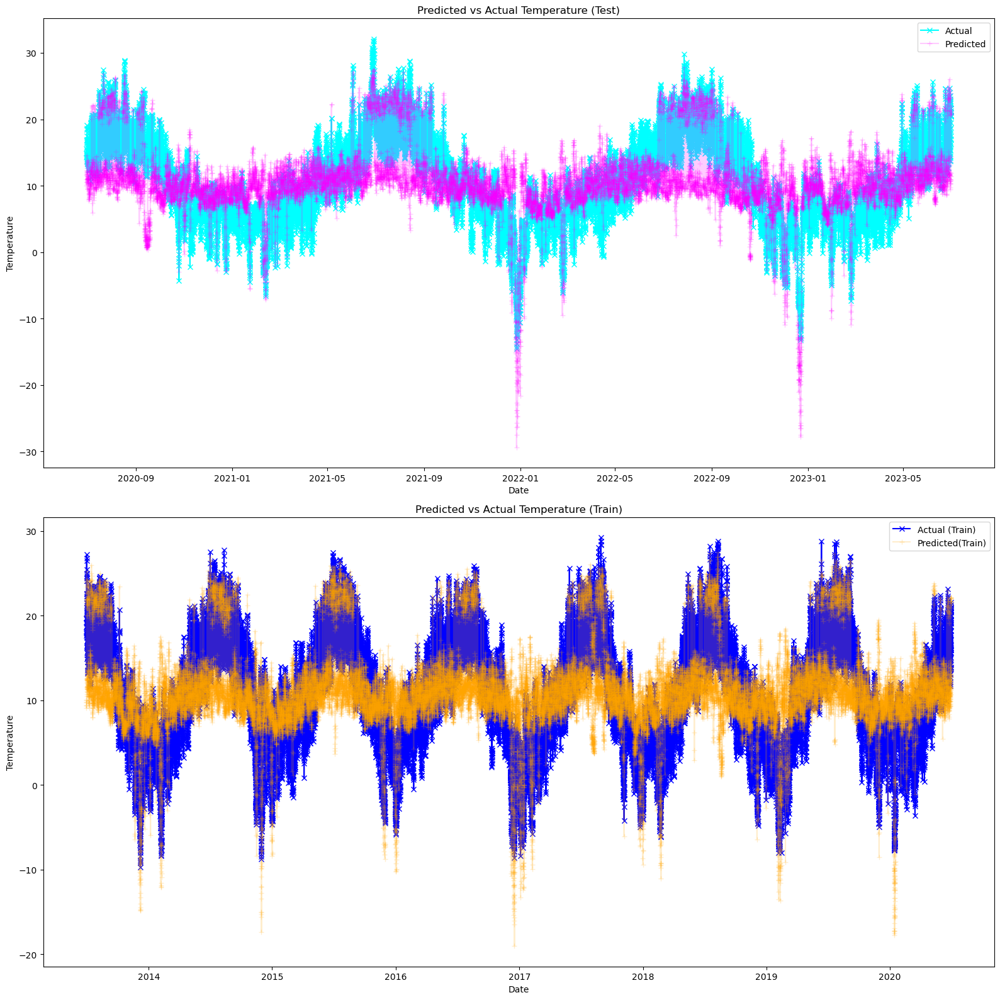

In [21]:
# Below I will plot the test predictions vs. actuals and then the train predictions vs. actuals.
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(16, 16))

# First subplot: Test Data
axes[0].plot(model_2_y_test.index, model_2_y_test, label='Actual', marker='x', color='cyan')
axes[0].plot(model_2_y_test.index, model_2_y_pred, label='Predicted', marker='+', color='magenta', alpha=.2)
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Temperature')
axes[0].set_title('Predicted vs Actual Temperature (Test)')
axes[0].legend()

# Second subplot: Train Data
axes[1].plot(model_2_y_train.index, model_2_y_train, label='Actual (Train)', marker='x', color='blue')
axes[1].plot(model_2_y_train.index, model_2_y_train_pred, label='Predicted(Train)', marker='+', color='orange', alpha=.2)
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Temperature')
axes[1].set_title('Predicted vs Actual Temperature (Train)')
axes[1].legend()

plt.tight_layout()
plt.show()

Without dew point, the model's performance has significantly dropped. The predictions were all being based, or guided, on the high correlation between dew point and temperature. 
</br></br>
The linear regression model including the dew point variable may still be a good predicting model, but we will continue to explore other options.

## Model #3: Vector Autogressive Model

The next model to try would be an Autoregression model. For a multivariate time series prediction problem like this one, we need to use a Vector Autoregressive Model.

In [22]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.api import VAR

# Assuming df is your original DataFrame and it's indexed by date-time
# Drop unnecessary columns
model_3_X = df.drop(['max_air_temp_pst1hr', 'min_air_temp_pst1hr', 'pressure_sea', 'wind_dir'], axis=1)

# Split the data into training and test sets
model_3_X_train = model_3_X.loc[model_3_X.index <= "2020-06-30"]
model_3_X_test = model_3_X.loc[model_3_X.index > "2020-06-30"]

# Scale the data
scaler = StandardScaler()
model_3_scaled_X_train = scaler.fit_transform(model_3_X_train)
model_3_scaled_X_test = scaler.transform(model_3_X_test)

# Instantiate the VAR model
model3 = VAR(model_3_scaled_X_train)

# Fit the model
results = model3.fit(maxlags=1)

results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 04, Sep, 2023
Time:                     14:25:09
--------------------------------------------------------------------
No. of Equations:         11.0000    BIC:                   -30.1079
Nobs:                     61344.0    HQIC:                  -30.1213
Log likelihood:          -33279.1    FPE:                8.23873e-14
AIC:                     -30.1273    Det(Omega_mle):     8.22103e-14
--------------------------------------------------------------------
Results for equation y1
            coefficient       std. error           t-stat            prob
-------------------------------------------------------------------------
const         -0.000001         0.000271           -0.005           0.996
L1.y1          0.995803         0.000298         3337.269           0.000
L1.y2         -0.001965         0.000353           -5.566           0.000
L1.y3          0.

The model is difficult to interpret and the lag is set to 1. Upon further research on this model, the model may not perform well with non-stationary data. In this case, due to the nature of the data set, removing the seasonality from the data to make it stationary may not be ideal. I will nonetheless attempt to use this model to predict temperature.

In [23]:
# Get the lag order
lag_order = results.k_ar

# Make predictions
# Using the last 'lag_order' observed values from the training set to start the forecast
predicted_values = results.forecast(model_3_scaled_X_train[-lag_order:], steps=len(model_3_X_test))

# Reverse scaling
predicted_values = scaler.inverse_transform(predicted_values)

# Convert predicted array into a DataFrame
predicted_df = pd.DataFrame(predicted_values, columns=model_3_X_train.columns, index=model_3_X_test.index)

In [24]:
# Check the results
print("Actual values:")
print(model_3_X_test['temperature'].head())
print("Predicted values:")
print(predicted_df['temperature'].head())

Actual values:
date_time_local
2020-06-30 01:00:00    15.6
2020-06-30 02:00:00    14.8
2020-06-30 03:00:00    14.3
2020-06-30 04:00:00    14.0
2020-06-30 05:00:00    14.5
Name: temperature, dtype: float64
Predicted values:
date_time_local
2020-06-30 01:00:00    15.791633
2020-06-30 02:00:00    15.701382
2020-06-30 03:00:00    15.630264
2020-06-30 04:00:00    15.575437
2020-06-30 05:00:00    15.533433
Name: temperature, dtype: float64


In [26]:
y_true = model_3_X_test['temperature']
y_pred = predicted_df['temperature']

# RMSE
rmse = math.sqrt(mean_squared_error(y_true, y_pred))
print(f'Root Mean Square Error (RMSE): {rmse}')

# MAE
mae = mean_absolute_error(y_true, y_pred)
print(f'Mean Absolute Error (MAE): {mae}')

# MFE (Mean Forecast Error) or Bias
mfe = np.mean(y_true - y_pred)
print(f'Mean Forecast Error (MFE/Bias): {mfe}')

# MAPE
# Use the full function name to avoid naming conflicts
mape_value = mean_absolute_percentage_error(y_true, y_pred)
print(f'Mean Absolute Percentage Error (MAPE): {mape_value}')

Root Mean Square Error (RMSE): 6.552265768119401
Mean Absolute Error (MAE): 5.421038373655317
Mean Forecast Error (MFE/Bias): -0.231580668810274
Mean Absolute Percentage Error (MAPE): 160.37341248457898


In the above evalution metrics we can see the model is not performing well for predictions. The high MAPE indicates the output prediction is not adequate, this number should be closer to 0 in a good predictive model. The RMSE and MAE show that the predictions deviate on average by 5 to 6 degrees (as we are using temperature). Finally the MFE/Bias is showing a negative value which would indicate the model is understimating the predictions. In other words, the model is predicting lower values when compared to the actual values.
</br></br>
I will plot the predicted vs. actual values below to observe the spread and accuracy of the model.

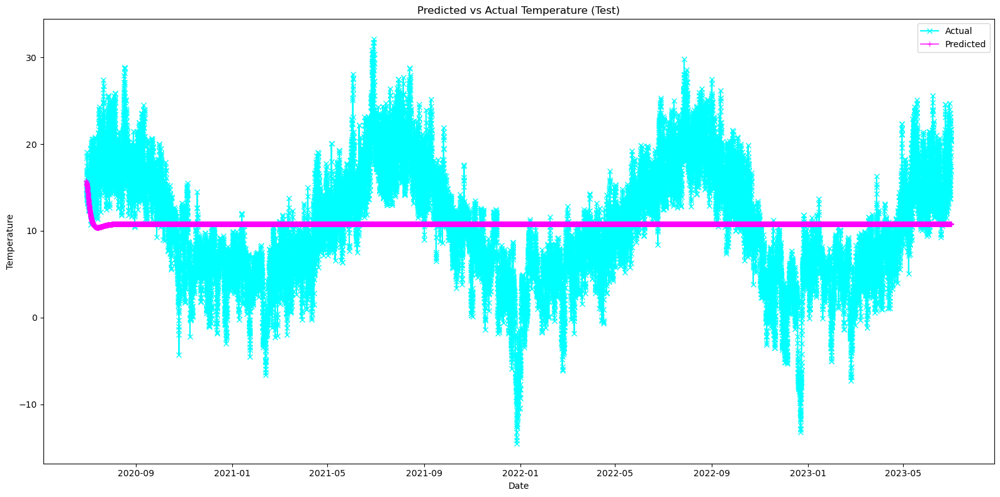

In [28]:
# Create a single subplot
fig, ax = plt.subplots(figsize=(16, 8))

# Plot the actual test data
ax.plot(model_3_X_test.index, model_3_X_test['temperature'], label='Actual', marker='x', color='cyan')

# Plot the predicted test data. Assuming 'predicted_df' is the DataFrame containing your forecasted values.
ax.plot(model_3_X_test.index, predicted_df['temperature'], label='Predicted', marker='+', color='magenta', alpha=.7)

# Adding labels and titles
ax.set_xlabel('Date')
ax.set_ylabel('Temperature')
ax.set_title('Predicted vs Actual Temperature (Test)')

# Show legend
ax.legend()

# Display the plot
plt.tight_layout()
plt.show()

Model #3 - VAR is not performing well and can be excluded from future iterations of this project. This is likely due to data not being stationary. The Baseline Modeling is completed and I will now proceed with a different model, Facebook Prophet.